In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [2]:
public_school=pd.read_csv('../data/Public_School_Characteristics_2022-23 (1).csv')

C:\Users\Mahboba\AppData\Local\Temp\ipykernel_43916\1745329213.py:1: DtypeWarning: Columns (11) have mixed types. Specify dtype option on import or set low_memory=False.
  public_school=pd.read_csv('../data/Public_School_Characteristics_2022-23 (1).csv')


In [3]:
#renaming some colums that will be mostly common in use
public_school.rename(columns={
    'STABR': 'STATE',
    
    'STUTERATIO': 'STUDENT_TEACHER_RATIO',
    'LATCOD': 'LAT',
    'LONCOD': 'LON',
    'TOTAL' : 'TOTAL_STUDENT',
    'FTE' :  'TOTAL_TEACHER',
    'LCITY' : 'CITY',
    'NMCNTY' : 'COUNTY',
    'SCHOOL_LEVEL' : 'SCHOOL_LEVEL',
    'ULOCALE' : 'CITY_RURAL',
    'FRELCH' : 'FREE_LUNCH',
    'REDLCH' : 'REDUCED_LUNCH',


}, inplace=True)

In [4]:
#average student-teacher ratio by state

average_ratio_state = public_school.groupby('STATE', as_index=False)['STUDENT_TEACHER_RATIO'].mean().sort_values(by='STUDENT_TEACHER_RATIO', ascending=False)

In [5]:
#removing state GU and AS becuase doesn't have any value reported
average_ratio_state_filtered = average_ratio_state[~average_ratio_state['STATE'].isin(['GU', 'AS'])]

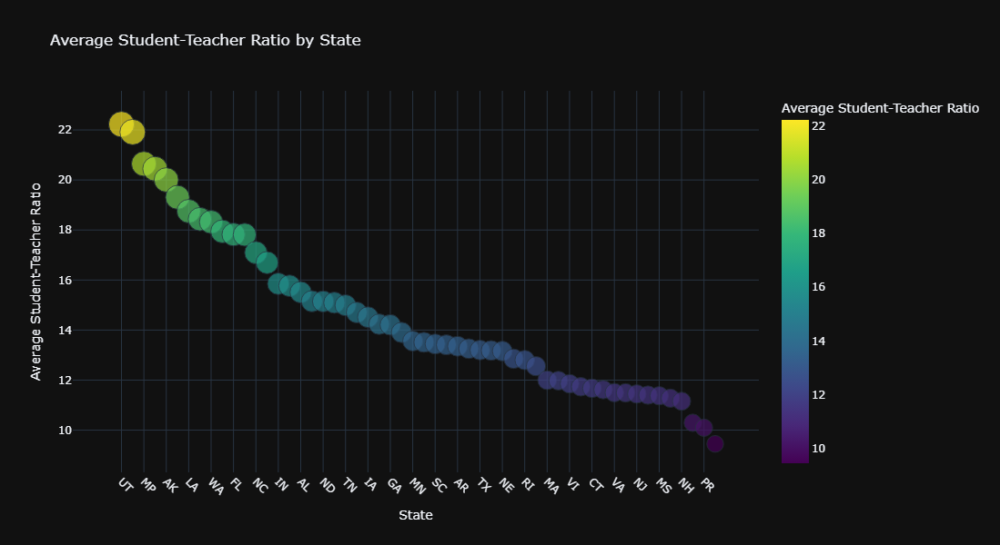

In [6]:
#scatter plotly plot to see the visual for student-teacher ratio

import plotly.express as px
fig = px.scatter(
    average_ratio_state_filtered,
    x='STATE',
    y='STUDENT_TEACHER_RATIO',
    size='STUDENT_TEACHER_RATIO',
    color='STUDENT_TEACHER_RATIO',
    hover_name='STATE',  
    title="Average Student-Teacher Ratio by State",
    labels={'STATE': 'State', 'STUDENT_TEACHER_RATIO': 'Average Student-Teacher Ratio'},
    color_continuous_scale='Viridis', 
    template='plotly_dark'  
)

# Update layout for better visual presentation
fig.update_layout(
    width=1000,
    height=600,
    xaxis_title='State',
    yaxis_title='Average Student-Teacher Ratio',
    xaxis_tickangle=45 
)

fig.show()

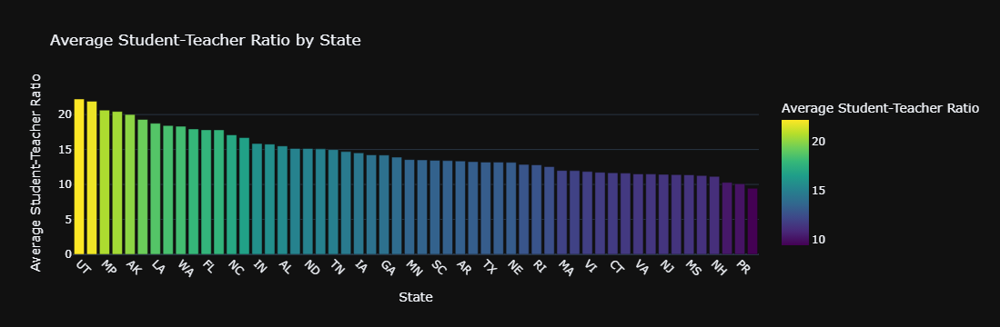

In [7]:
#bar Plot


fig = px.bar(average_ratio_state_filtered, 
             x='STATE', 
             y='STUDENT_TEACHER_RATIO',
             title='Average Student-Teacher Ratio by State',
             labels={'STATE': 'State', 'STUDENT_TEACHER_RATIO': 'Average Student-Teacher Ratio'},
             color='STUDENT_TEACHER_RATIO',  
             color_continuous_scale='Viridis',  
             template='plotly_dark')  

fig.update_layout(xaxis_title='State', yaxis_title='Average Student-Teacher Ratio', 
                  xaxis_tickangle=45)  
fig.show()

In [8]:
#adding latitude and longitude column by state 
state_coords = public_school.groupby('STATE')[['LAT', 'LON']].mean().reset_index()

In [9]:
#merged state cordination 
state_avg_ratio = average_ratio_state.merge(state_coords , on='STATE', how='left')

In [10]:
#Interactive Map of Student-Teacher Ratios by State

import  folium
# Function to determine marker color based on student-teacher ratio
def get_marker_color(ratio):
    if ratio > 25:
        return 'red'
    elif ratio > 20:
        return 'orange'
    elif ratio > 15:
        return 'red'
    else:
        return 'green'

# Center of the map
m = folium.Map(location=[37.0902, -95.7129], zoom_start=5)  # U.S. center coordinates



# Add state markers with student-teacher ratio information
for _, row in state_avg_ratio.iterrows():
    state = row['STATE']
    avg_ratio = row['STUDENT_TEACHER_RATIO']
    
    lat = row['LAT']
    lon = row['LON']
    
    color = get_marker_color(avg_ratio)
    
    folium.CircleMarker(
        location=[lat, lon],
        radius=7,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.6,
        popup=f"{state}: {avg_ratio:.2f} student-teacher ratio"  ).add_to(m)

# Save the map to an HTML file
m.save("state_student_teacher_ratio_map.html")
m

In [11]:
#getting aveage coordination for each county in the states

county_stats = public_school.groupby(['STATE', 'COUNTY'], as_index=False).agg(
    {'STUDENT_TEACHER_RATIO': 'mean', 'LAT': 'mean', 'LON': 'mean'}
)
county_stats

,STATE,COUNTY,STUDENT_TEACHER_RATIO,LAT,LON
0,AK,Aleutians East Borough,8.727500,54.846738,-162.990566
1,AK,Aleutians West Census Area,16.263333,54.255316,-170.619015
2,AK,Anchorage Municipality,20.186667,61.199502,-149.789558
3,AK,Bethel Census Area,15.449024,60.755183,-161.877304
4,AK,Bristol Bay Borough,19.865000,58.723530,-156.920934
...,...,...,...,...,...
3229,WY,Sweetwater County,10.345600,41.627023,-109.321701
3230,WY,Teton County,9.158000,43.526020,-110.785525
3231,WY,Uinta County,11.856923,41.276625,-110.731169
3232,WY,Washakie County,11.185000,44.007496,-107.888022


In [12]:


import folium
from folium.plugins import MarkerCluster

# Function to determine marker color based on student-teacher ratio
def get_marker_color(ratio):
    if ratio > 25:
        return 'red'
    elif ratio > 20:
        return 'orange'
    elif ratio > 15:
        return 'yellow'
    else:
        return 'green'



m = folium.Map(location=[37.0902, -95.7129], zoom_start=5)  # U.S. center coordinates


marker_cluster = MarkerCluster().add_to(m)


for _, row in county_stats.iterrows():
    county = row['COUNTY']
    state = row['STATE']
    avg_ratio = row['STUDENT_TEACHER_RATIO']
    lat = row['LAT']
    lon = row['LON']
    
    color = get_marker_color(avg_ratio)


    folium.CircleMarker(
        location=[lat, lon],
        radius=7,  
        color=color, 
        fill=True,
        fill_color=color,  
        fill_opacity=0.6,
        popup=f"{county}, {state}: {avg_ratio:.2f} student-teacher ratio"
    ).add_to(marker_cluster)


m.save("state_county_student_teacher_ratio_map.html")

m

In [13]:
# Filter public_school data for Tennessee
tennessee_data = public_school[public_school['STATE'] == 'TN']

In [14]:
tennessee_data

,X,Y,OBJECTID,NCESSCH,SURVYEAR,STATE,LEAID,ST_LEAID,LEA_NAME,SCH_NAME,...,HIALF,HI,TRALM,TRALF,TR,WHALM,WHALF,WH,LAT,LON
79331,-83.386666,36.177827,79332,470000100477,2022-2023,TN,4700001,TN-00320,Hamblen County,Alpha Elementary,...,23.0,43.0,24.0,27.0,51.0,247.0,209.0,456.0,36.177827,-83.386666
79332,-83.183800,36.267200,79333,470000100479,2022-2023,TN,4700001,TN-00320,Hamblen County,East Ridge Middle School,...,15.0,38.0,9.0,12.0,21.0,233.0,195.0,428.0,36.267200,-83.183800
79333,-83.292400,36.236800,79334,470000100480,2022-2023,TN,4700001,TN-00320,Hamblen County,Fairview Marguerite,...,166.0,333.0,9.0,5.0,14.0,56.0,72.0,128.0,36.236800,-83.292400
79334,-83.337658,36.208655,79335,470000100481,2022-2023,TN,4700001,TN-00320,Hamblen County,Manley Elementary,...,73.0,150.0,21.0,13.0,34.0,201.0,181.0,382.0,36.208655,-83.337658
79335,-83.203900,36.254400,79336,470000100483,2022-2023,TN,4700001,TN-00320,Hamblen County,Russellville Elementary,...,19.0,51.0,19.0,19.0,38.0,275.0,245.0,520.0,36.254400,-83.203900
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81226,-86.550366,36.169304,81227,470455002479,2022-2023,TN,4704550,TN-00950,Wilson County,Springdale Elementary School,...,36.0,65.0,20.0,22.0,42.0,279.0,277.0,556.0,36.169304,-86.550366
81227,-86.428740,36.114319,81228,470455002593,2022-2023,TN,4704550,TN-00950,Wilson County,Gladeville Middle School,...,32.0,64.0,14.0,16.0,30.0,371.0,360.0,731.0,36.114319,-86.428740
81228,-86.541068,36.228605,81229,470455002639,2022-2023,TN,4704550,TN-00950,Wilson County,Green Hill High School,...,55.0,135.0,21.0,14.0,35.0,701.0,650.0,1351.0,36.228605,-86.541068
81229,-86.308465,36.167496,81230,470455002686,2022-2023,TN,4704550,TN-00950,Wilson County,Barry Tatum Academy,...,3.0,9.0,1.0,0.0,1.0,12.0,15.0,27.0,36.167496,-86.308465


In [15]:
# Group by 'COUNTY' to get the average LAT, LON, and STUDENT_TEACHER_RATIO
county_grouped = tennessee_data.groupby('COUNTY').agg(
    LAT=('LAT', 'mean'),        # Average Latitude
    LON=('LON', 'mean'),        # Average Longitude
    
    STUDENT_TEACHER_RATIO=('STUDENT_TEACHER_RATIO', 'mean')  # Average Student-Teacher Ratio
).reset_index()

In [16]:
print(county_grouped.head())

            COUNTY        LAT        LON  STUDENT_TEACHER_RATIO
0  Anderson County  36.099878 -84.171697              12.535333
1   Bedford County  35.529149 -86.450013              13.984000
2    Benton County  36.065534 -88.109275               9.491250
3   Bledsoe County  35.599434 -85.195733              15.328000
4    Blount County  35.754415 -83.965773              14.869118


In [17]:
print(public_school['STATE'].unique())

['AL' 'AK' 'AZ' 'AR' 'CA' 'CO' 'CT' 'DE' 'DC' 'MD' 'FL' 'TX' 'GA' 'HI'
 'ID' 'OR' 'IL' 'IN' 'IA' 'KS' 'KY' 'LA' 'ME' 'MA' 'MI' 'MN' 'MS' 'MO'
 'MT' 'NE' 'NV' 'NH' 'NJ' 'NM' 'NY' 'NC' 'ND' 'OH' 'OK' 'PA' 'RI' 'SC'
 'SD' 'TN' 'UT' 'VT' 'VA' 'WA' 'WV' 'WI' 'WY' 'AS' 'GU' 'MP' 'PR' 'VI']


In [18]:
# Create the base map
m = folium.Map(location=[35.5175, -86.5804], zoom_start=7)

# Function to determine the marker color based on the student-teacher ratio
def get_marker_color(ratio):
    if ratio > 25:
        return 'red'
    elif ratio > 20:
        return 'orange'
    elif ratio > 15:
        return 'red'
    else:
        return 'green'

# Loop through your grouped data
for _, row in county_grouped.iterrows():
    county = row['COUNTY']
    avg_ratio = row['STUDENT_TEACHER_RATIO']
    lat = row['LAT']
    lon = row['LON']

    # Get the color based on the student-teacher ratio
    color = get_marker_color(avg_ratio)

    # Add CircleMarker to the map
    folium.CircleMarker(
        location=[lat, lon],
        radius=7,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        popup=f"{county}: {avg_ratio:.2f} student-teacher ratio"
    ).add_to(m)

# Save the map to an HTML file
m.save("tennessee_county_student_teacher_ratio_map.html")
m

In [19]:
#filtering by top 20 high average student to teacher ratio by county in TN

top_20_tn_counties = county_grouped.sort_values(by='STUDENT_TEACHER_RATIO', ascending=False).head(20)

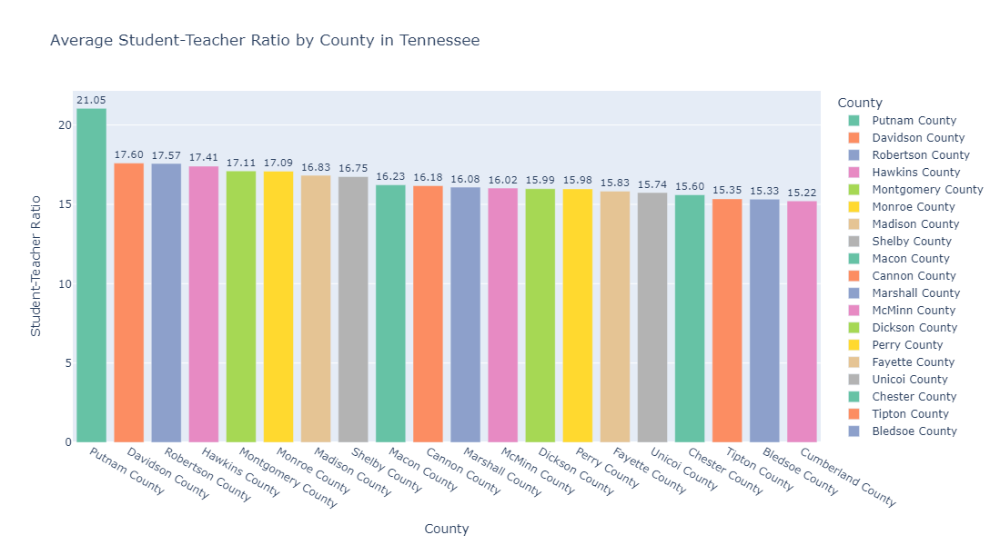

In [20]:

fig = px.bar(
    top_20_tn_counties,
    x='COUNTY',
    y='STUDENT_TEACHER_RATIO',
    text=top_20_tn_counties['STUDENT_TEACHER_RATIO'].round(2),
    title='Average Student-Teacher Ratio by County in Tennessee',
    labels={'COUNTY': 'County', 'STUDENT_TEACHER_RATIO': 'Student-Teacher Ratio'},
    color='COUNTY',
    color_discrete_sequence=px.colors.qualitative.Set2,
)

# Update trace for text positioning and format
fig.update_traces(
    texttemplate='%{text:.2f}',
    textposition='outside', 
)

# Update the layout of the figure (for size)
fig.update_layout(width=1100, height=600)

# Show the figure
fig.show() 

In [21]:
#Group by location type, such as urban or rural the get average student-teacher ratio for each location type.

urban_rural_grouped = public_school.groupby('CITY_RURAL', as_index=False)['STUDENT_TEACHER_RATIO'].mean()

In [22]:
urban_rural_grouped

,CITY_RURAL,STUDENT_TEACHER_RATIO
0,11-City: Large,15.436943
1,12-City: Mid-size,15.509249
2,13-City: Small,15.274504
3,21-Suburb: Large,15.557746
4,22-Suburb: Mid-size,16.012799
5,23-Suburb: Small,15.376077
6,31-Town: Fringe,15.495031
7,32-Town: Distant,14.826074
8,33-Town: Remote,16.392974
9,41-Rural: Fringe,14.933839


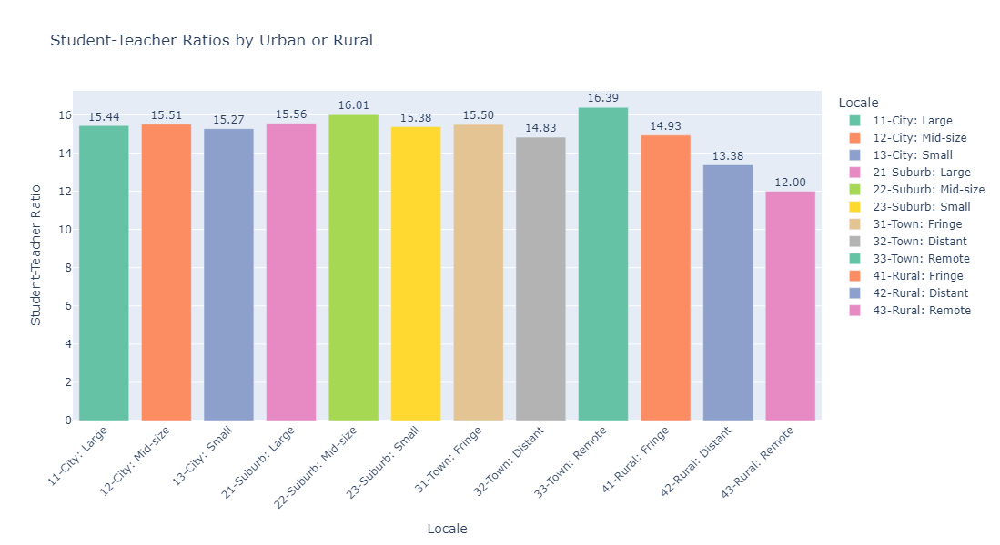

In [23]:
#Bar plot shows visual for each location type
fig = px.bar(urban_rural_grouped, 
             x='CITY_RURAL', 
             y='STUDENT_TEACHER_RATIO', 
             title="Student-Teacher Ratios by Urban or Rural", 
             labels={'CITY_RURAL': 'Locale', 'STUDENT_TEACHER_RATIO': 'Student-Teacher Ratio'}, 
             color='CITY_RURAL', 
             color_discrete_sequence=px.colors.qualitative.Set2,
            text='STUDENT_TEACHER_RATIO')
fig.update_traces(
    texttemplate='%{text:.2f}',  
    textposition='outside', )

fig.update_layout(xaxis_tickangle=-45)  
fig.update_layout(width=1100, height=600)  
fig.show()

In [24]:
# Group by school level  Elementary, Middle, High and get average student-teacher ratio for each school level

average_ratios_type = public_school.groupby('SCHOOL_LEVEL')['STUDENT_TEACHER_RATIO'].mean().reset_index()

In [25]:
average_ratios_type

,SCHOOL_LEVEL,STUDENT_TEACHER_RATIO
0,Adult Education,-0.555556
1,Elementary,15.328624
2,High,14.599876
3,Middle,15.262865
4,Not applicable,-1.007067
5,Not reported,-1.649552
6,Other,16.579451
7,Prekindergarten,22.476238
8,Secondary,8.620325
9,Ungraded,4.131447


In [26]:
#dataset  have some negative number and missing number in data set 

cleaned_data = public_school[public_school['STUDENT_TEACHER_RATIO'] > 0]

In [27]:
average_ratios_type = cleaned_data.groupby('SCHOOL_LEVEL')['STUDENT_TEACHER_RATIO'].mean().reset_index()

In [28]:
average_ratios_type

,SCHOOL_LEVEL,STUDENT_TEACHER_RATIO
0,Elementary,15.543018
1,High,16.068857
2,Middle,15.476188
3,Other,18.665224
4,Prekindergarten,25.523704
5,Secondary,13.692766
6,Ungraded,8.526053


In [29]:
#dictionary map to original school level names to more readable

school_level_mapping = {
    "Prekindergarten": "Pre-K",
    "Elementary": "Elementary School",
    "Middle": "Middle School",
    "High": "High School",
    "Secondary": "Secondary School",
    "Ungraded": "Reported As Ungraded",
    "Other": "Not Reported"  
}

In [30]:
average_ratios_type['SCHOOL_LEVEL'] = average_ratios_type['SCHOOL_LEVEL'].map(school_level_mapping)

In [31]:
average_ratios_type

,SCHOOL_LEVEL,STUDENT_TEACHER_RATIO
0,Elementary School,15.543018
1,High School,16.068857
2,Middle School,15.476188
3,Not Reported,18.665224
4,Pre-K,25.523704
5,Secondary School,13.692766
6,Reported As Ungraded,8.526053


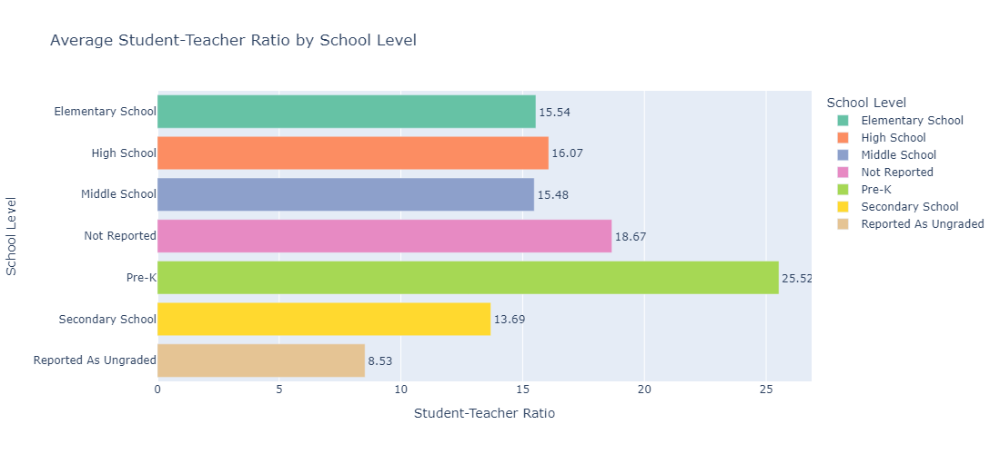

In [32]:
#horizental bar plot Average Student-Teacher Ratio by School Level

fig = px.bar(
    average_ratios_type,
    y='SCHOOL_LEVEL',  
    x='STUDENT_TEACHER_RATIO',  
    title='Average Student-Teacher Ratio by School Level',
    labels={'SCHOOL_LEVEL': 'School Level', 'STUDENT_TEACHER_RATIO': 'Average Student-Teacher Ratio'},
    color='SCHOOL_LEVEL',  
    color_discrete_sequence=px.colors.qualitative.Set2,
    text='STUDENT_TEACHER_RATIO')
fig.update_traces(
    texttemplate='%{text:.2f}',  
    textposition='outside', )

fig.update_layout(
    xaxis_title="Student-Teacher Ratio",
    yaxis_title="School Level",
    width=1100,
    height=500
)

fig.show()

In [33]:
#to get school level student-techaer ratio by TN state

tn_data = public_school[public_school['STATE'] == 'TN']

In [34]:
average_ratios_tn_school_type = tn_data.groupby('SCHOOL_LEVEL')['STUDENT_TEACHER_RATIO'].mean().reset_index()

In [35]:
average_ratios_tn_school_type

,SCHOOL_LEVEL,STUDENT_TEACHER_RATIO
0,Elementary,15.282326
1,High,14.516193
2,Middle,15.849913
3,Other,13.204103
4,Prekindergarten,8.335128
5,Secondary,15.396667


In [36]:
average_ratios_tn_school_type['SCHOOL_LEVEL'] = average_ratios_tn_school_type['SCHOOL_LEVEL'].map(school_level_mapping)

In [37]:
average_ratios_tn_school_type

,SCHOOL_LEVEL,STUDENT_TEACHER_RATIO
0,Elementary School,15.282326
1,High School,14.516193
2,Middle School,15.849913
3,Not Reported,13.204103
4,Pre-K,8.335128
5,Secondary School,15.396667


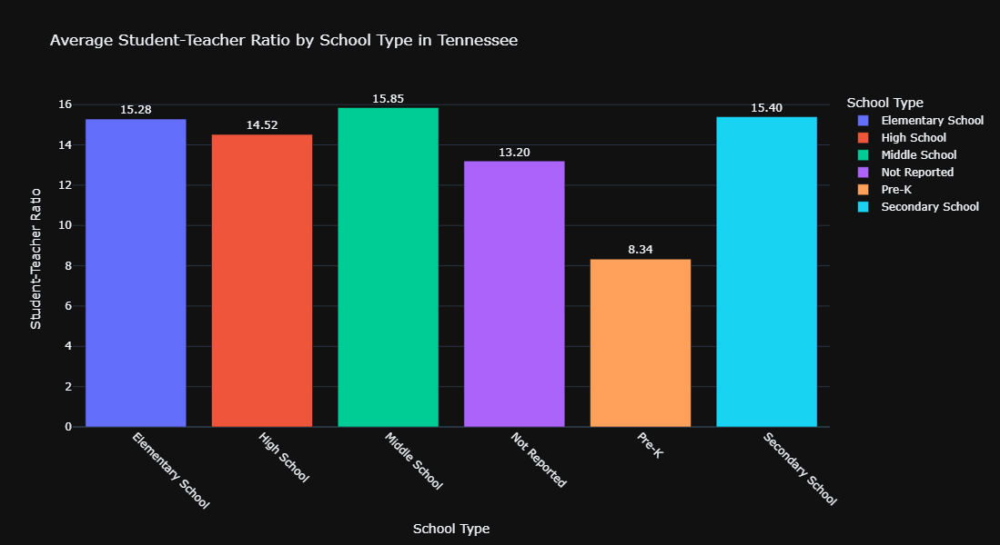

In [38]:
#bar plot to show Average Student-Teacher Ratio by School Type in Tennessee

import plotly.io as pio
fig = px.bar(average_ratios_tn_school_type, 
             x='SCHOOL_LEVEL', 
             y='STUDENT_TEACHER_RATIO',
             title='Average Student-Teacher Ratio by School Type in Tennessee',
             labels={'SCHOOL_LEVEL': 'School Type', 'STUDENT_TEACHER_RATIO': 'Average Student-Teacher Ratio'},
             color='SCHOOL_LEVEL',  
             color_continuous_scale='Viridis',  
             template='plotly_dark',
            text='STUDENT_TEACHER_RATIO')
fig.update_traces(
    texttemplate='%{text:.2f}',  # Format the text to show 2 decimal places
    textposition='outside', )

fig.update_layout(xaxis_title='School Type', yaxis_title='Student-Teacher Ratio', 
                  xaxis_tickangle=45,
                  height=600
                 )
fig.write_html("plot.html")
fig.show()

In [39]:
public_school['CHARTER_TEXT'] = public_school['CHARTER_TEXT'].str.lower()

In [40]:
public_school['CHARTER_TEXT'] = public_school['CHARTER_TEXT'].map({'yes': 'Charter', 'no': 'Public'})

In [41]:
average_ratio_by_charter = public_school.groupby('CHARTER_TEXT')['STUDENT_TEACHER_RATIO'].mean().reset_index()

In [42]:
average_ratio_by_charter

,CHARTER_TEXT,STUDENT_TEACHER_RATIO
0,Charter,18.207307
1,Public,14.793009


In [43]:

columns_to_keep = [
    'STATE', 
    'STUDENT_TEACHER_RATIO', 
    'LAT', 
    'LON', 
    'TOTAL_STUDENT', 
    'TOTAL_TEACHER', 
    'CITY', 
    'COUNTY', 
    'SCHOOL_LEVEL', 
    'CITY_RURAL', 
    'FREE_LUNCH', 
    'REDUCED_LUNCH'
]


new_public_school_df = public_school[columns_to_keep]

new_public_school_df

,STATE,STUDENT_TEACHER_RATIO,LAT,LON,TOTAL_STUDENT,TOTAL_TEACHER,CITY,COUNTY,SCHOOL_LEVEL,CITY_RURAL,FREE_LUNCH,REDUCED_LUNCH
0,AL,19.78,34.260200,-86.206200,890.0,45.000000,Albertville,Marshall County,Middle,32-Town: Distant,654,43
1,AL,20.09,34.262200,-86.204900,1712.0,85.199997,Albertville,Marshall County,High,32-Town: Distant,1178,76
2,AL,20.33,34.273300,-86.220100,874.0,43.000000,Albertville,Marshall County,Middle,32-Town: Distant,665,53
3,AL,20.33,34.252700,-86.221806,874.0,43.000000,Albertville,Marshall County,Elementary,32-Town: Distant,680,43
4,AL,23.31,34.289800,-86.193300,606.0,26.000000,Albertville,Marshall County,Elementary,32-Town: Distant,367,25
...,...,...,...,...,...,...,...,...,...,...,...,...
101385,VI,16.56,18.341950,-64.917602,298.0,18.000000,Saint Thomas,St. Thomas Island,Elementary,33-Town: Remote,295,0
101386,VI,15.00,18.338742,-64.952483,420.0,28.000000,Saint Thomas,St. Thomas Island,Elementary,33-Town: Remote,417,0
101387,VI,12.59,18.354782,-64.899024,428.0,34.000000,Saint Thomas,St. Thomas Island,Elementary,33-Town: Remote,425,0
101388,VI,11.06,18.336658,-64.945940,686.0,62.000000,Saint Thomas,St. Thomas Island,Middle,33-Town: Remote,683,0


In [44]:
# Calculate total number of students eligible for free lunch (FRELCH)
new_public_school_df['TOTAL_LUNCH_ELIGIBLE'] = new_public_school_df['FREE_LUNCH'] + new_public_school_df['REDUCED_LUNCH']

C:\Users\Mahboba\AppData\Local\Temp\ipykernel_43916\3003559475.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [45]:
new_public_school_df['PERCENT_LUNCH_ELIGIBLE'] = (new_public_school_df['TOTAL_LUNCH_ELIGIBLE'] / new_public_school_df['TOTAL_STUDENT']) * 100


C:\Users\Mahboba\AppData\Local\Temp\ipykernel_43916\2500278388.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [46]:
# Group by school level and calculate the correlation
grouped_by_school_level = new_public_school_df.groupby('SCHOOL_LEVEL').agg({
    'PERCENT_LUNCH_ELIGIBLE': 'mean', 
    'STUDENT_TEACHER_RATIO': 'mean'
}).reset_index()

In [47]:
grouped_by_school_level 

,SCHOOL_LEVEL,PERCENT_LUNCH_ELIGIBLE,STUDENT_TEACHER_RATIO
0,Adult Education,-inf,-0.555556
1,Elementary,-inf,15.328624
2,High,-inf,14.599876
3,Middle,-inf,15.262865
4,Not applicable,NaN,-1.007067
5,Not reported,NaN,-1.649552
6,Other,-inf,16.579451
7,Prekindergarten,-inf,22.476238
8,Secondary,-inf,8.620325
9,Ungraded,-inf,4.131447


In [48]:
#need to clean the data
school_level_mapping = {
    "Prekindergarten": "Pre-K",
    "Elementary": "Elementary School",
    "Middle": "Middle School",
    "High": "High School",
    "Secondary": "Secondary School",
    "Ungraded": "Reported As Ungraded",
}

In [49]:
# Apply the mapping to the 'SCHOOL_LEVEL' column
new_public_school_df['SCHOOL_LEVEL'] = new_public_school_df['SCHOOL_LEVEL'].replace(school_level_mapping)

C:\Users\Mahboba\AppData\Local\Temp\ipykernel_43916\4241143682.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [50]:
# Now, filter the DataFrame to keep only the rows where 'SCHOOL_LEVEL' is one of the mapped categories
valid_school_levels = list(school_level_mapping.values())

In [51]:
# Filter out rows that don't match the valid school levels
cleaned_df = new_public_school_df[new_public_school_df['SCHOOL_LEVEL'].isin(valid_school_levels)]

In [52]:
cleaned_df = new_public_school_df[(new_public_school_df['PERCENT_LUNCH_ELIGIBLE'] >= 0) & 
                                   (new_public_school_df['STUDENT_TEACHER_RATIO'] >= 0)]

In [53]:
cleaned_df

,STATE,STUDENT_TEACHER_RATIO,LAT,LON,TOTAL_STUDENT,TOTAL_TEACHER,CITY,COUNTY,SCHOOL_LEVEL,CITY_RURAL,FREE_LUNCH,REDUCED_LUNCH,TOTAL_LUNCH_ELIGIBLE,PERCENT_LUNCH_ELIGIBLE
0,AL,19.78,34.260200,-86.206200,890.0,45.000000,Albertville,Marshall County,Middle School,32-Town: Distant,654,43,697,78.314607
1,AL,20.09,34.262200,-86.204900,1712.0,85.199997,Albertville,Marshall County,High School,32-Town: Distant,1178,76,1254,73.247664
2,AL,20.33,34.273300,-86.220100,874.0,43.000000,Albertville,Marshall County,Middle School,32-Town: Distant,665,53,718,82.151030
3,AL,20.33,34.252700,-86.221806,874.0,43.000000,Albertville,Marshall County,Elementary School,32-Town: Distant,680,43,723,82.723112
4,AL,23.31,34.289800,-86.193300,606.0,26.000000,Albertville,Marshall County,Elementary School,32-Town: Distant,367,25,392,64.686469
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101385,VI,16.56,18.341950,-64.917602,298.0,18.000000,Saint Thomas,St. Thomas Island,Elementary School,33-Town: Remote,295,0,295,98.993289
101386,VI,15.00,18.338742,-64.952483,420.0,28.000000,Saint Thomas,St. Thomas Island,Elementary School,33-Town: Remote,417,0,417,99.285714
101387,VI,12.59,18.354782,-64.899024,428.0,34.000000,Saint Thomas,St. Thomas Island,Elementary School,33-Town: Remote,425,0,425,99.299065
101388,VI,11.06,18.336658,-64.945940,686.0,62.000000,Saint Thomas,St. Thomas Island,Middle School,33-Town: Remote,683,0,683,99.562682


In [54]:
grouped_by_school_level = cleaned_df.groupby('SCHOOL_LEVEL')[['PERCENT_LUNCH_ELIGIBLE', 'STUDENT_TEACHER_RATIO']].mean().reset_index()

In [55]:
grouped_by_school_level 

,SCHOOL_LEVEL,PERCENT_LUNCH_ELIGIBLE,STUDENT_TEACHER_RATIO
0,Adult Education,33.464056,0.000000
1,Elementary School,58.391875,15.768894
2,High School,55.551299,16.299888
3,Middle School,56.499774,15.705141
4,Other,62.629910,15.862310
5,Pre-K,57.448379,26.127137
6,Reported As Ungraded,72.860648,6.310645
7,Secondary School,57.973233,14.597373


In [143]:
# Remove the rows where 'SCHOOL_LEVEL' is 'Adult Education' or 'Not Reported'
grouped_by_school_level = grouped_by_school_level[~grouped_by_school_level['SCHOOL_LEVEL'].isin(['Adult Education', 'Not Reported','Other'])]

In [145]:
# Reset the index to start from 0
grouped_by_school_level = grouped_by_school_level.reset_index(drop=True)

In [147]:
grouped_by_school_level['SCHOOL_LEVEL'] = grouped_by_school_level['SCHOOL_LEVEL'].replace({
    'Secondary School': 'High School'
})

In [149]:
# Now, group by school level again to calculate the mean for PERCENT_LUNCH_ELIGIBLE and STUDENT_TEACHER_RATIO
grouped_by_school_level = grouped_by_school_level.groupby('SCHOOL_LEVEL')[['PERCENT_LUNCH_ELIGIBLE', 'STUDENT_TEACHER_RATIO']].mean().reset_index()

In [151]:
grouped_by_school_level 

,SCHOOL_LEVEL,PERCENT_LUNCH_ELIGIBLE,STUDENT_TEACHER_RATIO
0,Elementary School,58.391875,15.768894
1,High School,56.762266,15.448631
2,Middle School,56.499774,15.705141
3,Pre-K,57.448379,26.127137
4,Reported As Ungraded,72.860648,6.310645


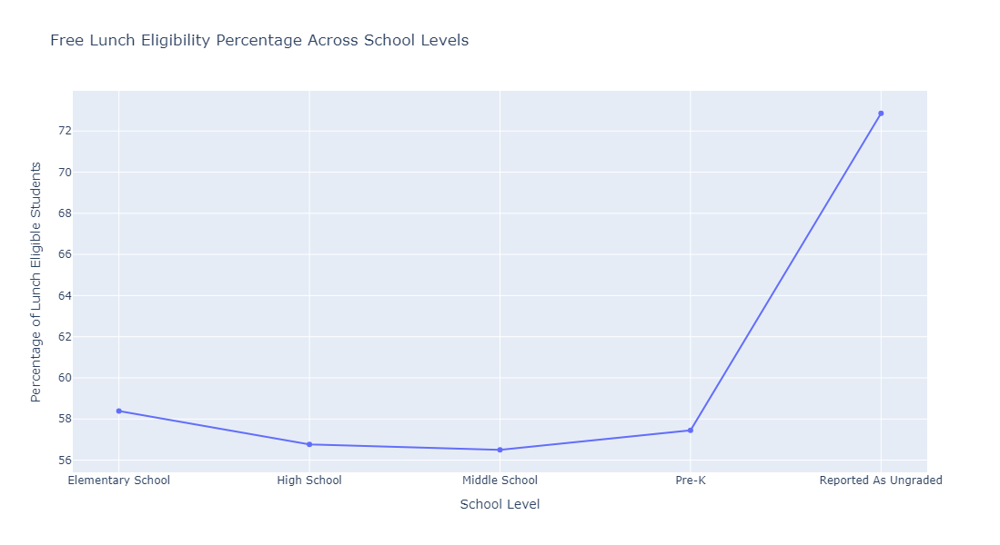

In [264]:
fig = px.line(
    grouped_by_school_level,
    x='SCHOOL_LEVEL',
    y='PERCENT_LUNCH_ELIGIBLE',
    markers=True,
    title='Free Lunch Eligibility Percentage Across School Levels',
    labels={'SCHOOL_LEVEL': 'School Level', 'PERCENT_LUNCH_ELIGIBLE': 'Percentage of Lunch Eligible Students'},
    height=600
)

# Show the plot
fig.show()

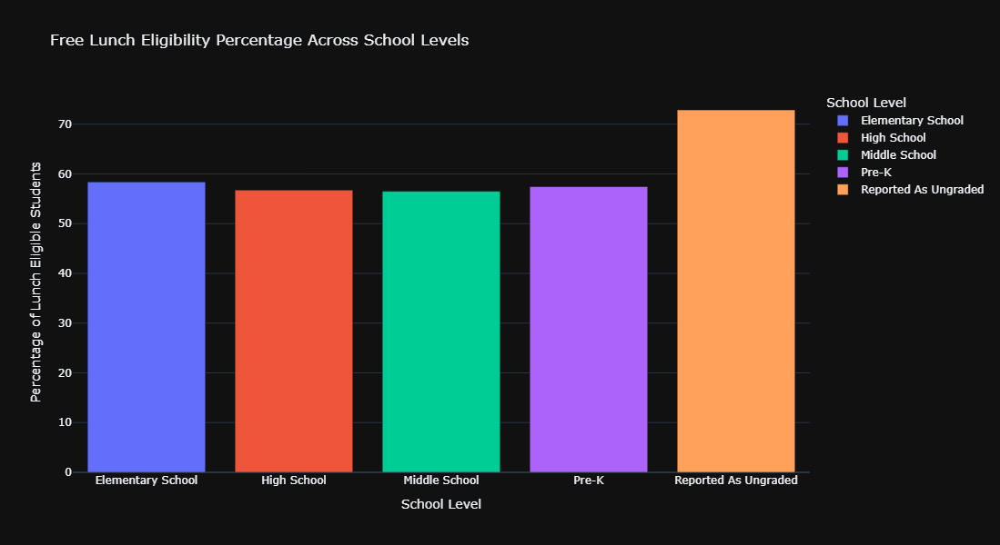

In [262]:
import plotly.io as pio
import plotly.express as px

fig = px.bar(
    grouped_by_school_level,
    x='SCHOOL_LEVEL',
    y='PERCENT_LUNCH_ELIGIBLE',
    title='Free Lunch Eligibility Percentage Across School Levels',
    labels={'SCHOOL_LEVEL': 'School Level', 'PERCENT_LUNCH_ELIGIBLE': 'Percentage of Lunch Eligible Students'},
    color='SCHOOL_LEVEL',  
    template='plotly_dark',  
    height=600
)


fig.show()

In [278]:
# Calculating the percentage of school status for students eligible for free/lunch
clean_data = public_school.dropna(subset=['TOTAL_STUDENT', 'TOTFRL'])

In [300]:
# Remove rows where TOTFRL has negative values
public_school[public_school['TOTFRL'] >= 0]

,X,Y,OBJECTID,NCESSCH,SURVYEAR,STATE,LEAID,ST_LEAID,LEA_NAME,SCH_NAME,...,TRALM,TRALF,TR,WHALM,WHALF,WH,LAT,LON,GRADE_SPAN,FRL_percentage
0,-86.206200,34.260200,1,10000500870,2022-2023,AL,100005,AL-101,Albertville City,Albertville Middle School,...,17.0,15.0,32.0,168.0,147.0,315.0,34.260200,-86.206200,1.0,78.314607
1,-86.204900,34.262200,2,10000500871,2022-2023,AL,100005,AL-101,Albertville City,Albertville High School,...,26.0,19.0,45.0,325.0,316.0,641.0,34.262200,-86.204900,3.0,73.247664
2,-86.220100,34.273300,3,10000500879,2022-2023,AL,100005,AL-101,Albertville City,Albertville Intermediate School,...,7.0,6.0,13.0,154.0,144.0,298.0,34.273300,-86.220100,1.0,82.151030
3,-86.221806,34.252700,4,10000500889,2022-2023,AL,100005,AL-101,Albertville City,Albertville Elementary School,...,11.0,16.0,27.0,168.0,136.0,304.0,34.252700,-86.221806,1.0,82.723112
4,-86.193300,34.289800,5,10000501616,2022-2023,AL,100005,AL-101,Albertville City,Albertville Kindergarten and PreK,...,4.0,4.0,8.0,104.0,120.0,224.0,34.289800,-86.193300,NaN,64.686469
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101385,-64.917602,18.341950,101386,780003000024,2022-2023,VI,7800030,VI-001,Saint Thomas - Saint John School District,LOCKHART ELEMENTARY SCHOOL,...,1.0,2.0,3.0,1.0,0.0,1.0,18.341950,-64.917602,2.0,98.993289
101386,-64.952483,18.338742,101387,780003000026,2022-2023,VI,7800030,VI-001,Saint Thomas - Saint John School District,ULLA F MULLER ELEMENTARY SCHOOL,...,2.0,0.0,2.0,2.0,5.0,7.0,18.338742,-64.952483,5.0,99.285714
101387,-64.899024,18.354782,101388,780003000027,2022-2023,VI,7800030,VI-001,Saint Thomas - Saint John School District,YVONNE BOWSKY ELEMENTARY SCHOOL,...,0.0,1.0,1.0,8.0,4.0,12.0,18.354782,-64.899024,5.0,99.299065
101388,-64.945940,18.336658,101389,780003000033,2022-2023,VI,7800030,VI-001,Saint Thomas - Saint John School District,CANCRYN JUNIOR HIGH SCHOOL,...,0.0,1.0,1.0,6.0,10.0,16.0,18.336658,-64.945940,4.0,99.562682


In [302]:
public_school['FRL_percentage'] = (public_school['TOTFRL'] / public_school['TOTAL_STUDENT']) * 100

C:\Users\Mahboba\AppData\Local\Temp\ipykernel_43916\300154475.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [304]:
public_school['TOTAL_STUDENT'] = public_school['TOTAL_STUDENT'].fillna(0)

C:\Users\Mahboba\AppData\Local\Temp\ipykernel_43916\1767939149.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [310]:
import numpy as np

# Avoid division by zero by checking for 0 in 'TOTAL_STUDENT'
public_school['FRL_percentage'] = np.where(public_school['TOTAL_STUDENT'] == 0, 0, (public_school['TOTFRL'] / public_school['TOTAL_STUDENT']) * 100)

C:\Users\Mahboba\AppData\Local\Temp\ipykernel_43916\2552680835.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [312]:
status_grouped_df = public_school.groupby('SY_STATUS_TEXT').agg(
    average_enrollment=('TOTAL_STUDENT', 'mean'),
    average_FRL_percentage=('FRL_percentage', 'mean')
).reset_index()


In [314]:
status_grouped_df

,SY_STATUS_TEXT,average_enrollment,average_FRL_percentage
0,Currently operational,500.137721,46.925277
1,New school,264.839721,28.070189
2,School has changed agency,343.333333,37.826695
3,School has reopened,95.952381,58.702137
4,School was operational but not reported last year,54.424658,-25.907573


In [176]:
#counts of school by state which are virtual

virtual_categories = ["Full Virtual", "Supplemental Virtual", "Virtual with face to face options"]


In [178]:
virtual_categories

['Full Virtual', 'Supplemental Virtual', 'Virtual with face to face options']

In [180]:
# Filter for virtual schools
virtual_schools = public_school[public_school["VIRTUAL"].isin(virtual_categories)]

In [182]:
virtual_schools

,X,Y,OBJECTID,NCESSCH,SURVYEAR,STATE,LEAID,ST_LEAID,LEA_NAME,SCH_NAME,...,HI,TRALM,TRALF,TR,WHALM,WHALF,WH,LAT,LON,GRADE_SPAN
95,-86.964919,34.800179,96,10012002417,2022-2023,AL,100120,AL-107,Athens City,Athens Renaissance School,...,29.0,9.0,15.0,24.0,246.0,286.0,532.0,34.800179,-86.964919,11.0
114,-88.078474,30.757103,115,10018802514,2022-2023,AL,100188,AL-121,Chickasaw City,Alabama Destinations Career Academy,...,85.0,21.0,23.0,44.0,341.0,371.0,712.0,30.757103,-88.078474,10.0
215,-87.899726,30.584455,216,10027002443,2022-2023,AL,100270,AL-002,Baldwin County,Baldwin County Virtual School,...,10.0,11.0,10.0,21.0,86.0,158.0,244.0,30.584455,-87.899726,3.0
218,-87.899726,30.584455,219,10027002493,2022-2023,AL,100270,AL-002,Baldwin County,Baldwin County Elementary Virtual School,...,14.0,8.0,10.0,18.0,87.0,72.0,159.0,30.584455,-87.899726,7.0
289,-86.828000,33.558400,290,10039002553,2022-2023,AL,100390,AL-114,Birmingham City,BCS Virtual Academy of Learning,...,13.0,1.0,1.0,2.0,0.0,2.0,2.0,33.558400,-86.828000,9.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99856,-90.222950,43.662531,99857,551713002225,2022-2023,WI,5517130,WI-6713,Wonewoc-Union Center School District,Wonewoc-Center High,...,3.0,1.0,1.0,2.0,47.0,60.0,107.0,43.662531,-90.222950,3.0
99857,-90.222950,43.662531,99858,551713002226,2022-2023,WI,5517130,WI-6713,Wonewoc-Union Center School District,Wonewoc-Center Junior High,...,2.0,1.0,0.0,1.0,40.0,35.0,75.0,43.662531,-90.222950,2.0
99858,-90.222950,43.662531,99859,551713003059,2022-2023,WI,5517130,WI-6713,Wonewoc-Union Center School District,Wonewoc-Center Virtual Academy,...,0.0,0.0,0.0,0.0,2.0,4.0,6.0,43.662531,-90.222950,11.0
99859,-89.692500,45.926800,99860,551716002227,2022-2023,WI,5517160,WI-6720,Woodruff J1 School District,Arbor Vitae-Woodruff Elementary,...,23.0,21.0,12.0,33.0,216.0,207.0,423.0,45.926800,-89.692500,8.0


In [186]:
# Count virtual schools per state
virtual_counts = virtual_schools.groupby("STATE")["VIRTUAL"].count().reset_index()

In [194]:
state_counts = virtual_schools.groupby("STATE").size().reset_index(name="Virtual_School_Count")

In [196]:
state_counts

,STATE,Virtual_School_Count
0,AK,258
1,AL,17
2,AR,487
3,AZ,140
4,CA,1403
5,CO,64
6,CT,1013
7,DC,1
8,FL,197
9,GA,11


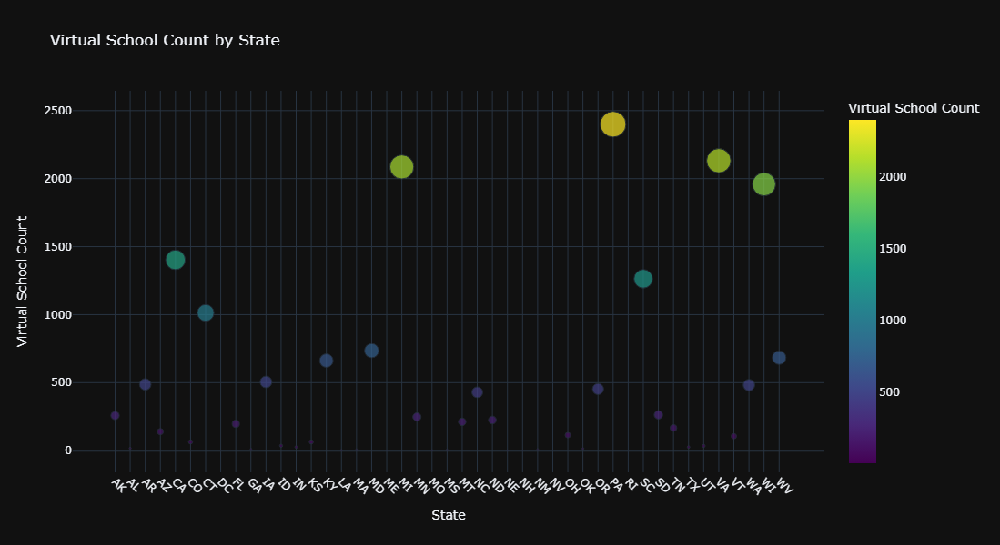

In [242]:
fig = px.scatter(
    state_counts,  # Your dataframe with state counts
    x='STATE',  # States on the x-axis
    y='Virtual_School_Count',  # Count of virtual schools on the y-axis
    size='Virtual_School_Count',  # Bubble size based on virtual school count
    color='Virtual_School_Count',  # Color based on virtual school count
    hover_name='STATE',  # Show state name on hover
    title="Virtual School Count by State",  # Plot title
    labels={'STATE': 'State', 'Virtual_School_Count': 'Virtual School Count'},  # Axis labels
    color_continuous_scale='Viridis',  # Color scale for the counts
    template='plotly_dark'  # Dark theme for the plot
)

# Update layout for better visual presentation
fig.update_layout(
    width=1000,
    height=600,
    xaxis_title='State',  # Label for the x-axis
    yaxis_title='Virtual School Count',  # Label for the y-axis
    xaxis_tickangle=45,  # Angle for state names on the x-axis
    showlegend=False  # Hide the legend for a cleaner look
)

# Show the plot
fig.show()

In [244]:
#now looking for virtual in school type

state_level_counts = virtual_schools.groupby(["STATE", "SCHOOL_LEVEL"]).size().reset_index(name="Virtual_School_Count")

In [246]:
state_level_counts

,STATE,SCHOOL_LEVEL,Virtual_School_Count
0,AK,Elementary,98
1,AK,High,40
2,AK,Middle,22
3,AK,Other,98
4,AL,Elementary,1
...,...,...,...
177,WV,High,111
178,WV,Middle,109
179,WV,Not reported,36
180,WV,Other,18


In [248]:
school_level_mapping = {
    "Prekindergarten": "Pre-K",
    "Elementary": "Elementary School",
    "Middle": "Middle School",
    "High": "High School",
    "Secondary": "Secondary School",
    "Ungraded": "Reported As Ungraded"
}

In [250]:
state_level_counts['SCHOOL_LEVEL'] = state_level_counts['SCHOOL_LEVEL'].map(school_level_mapping)


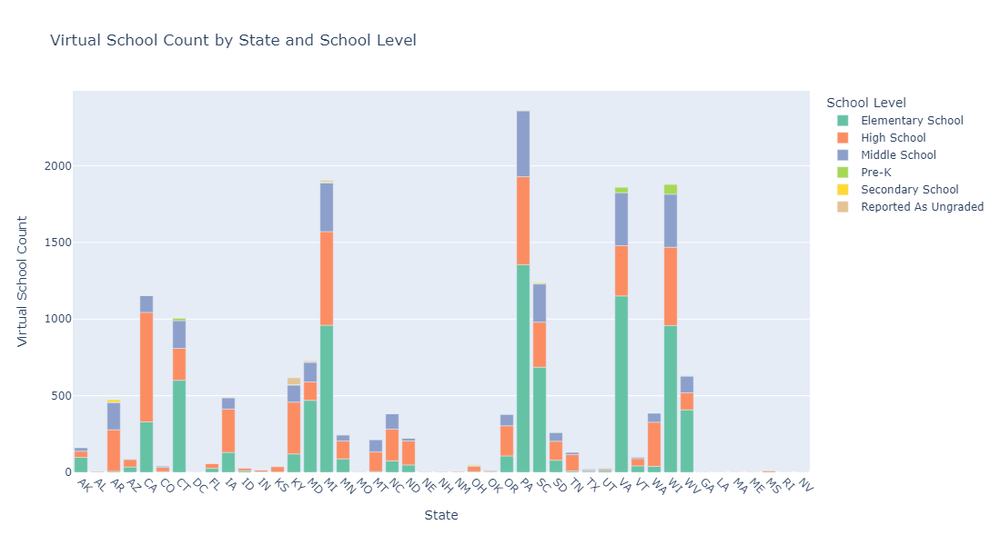

In [268]:
fig = px.bar(
    state_level_counts,
    x='STATE',  
    y='Virtual_School_Count',  
    color='SCHOOL_LEVEL',  # Color by school level
    #text=state_level_counts['Virtual_School_Count'].round(2),  # Display virtual school count on top
    title='Virtual School Count by State and School Level',
    labels={'STATE': 'State', 'Virtual_School_Count': 'Count of Virtual Schools', 'SCHOOL_LEVEL': 'School Level'},
    color_discrete_sequence=px.colors.qualitative.Set2,  # Set of colors for different school levels
    hover_data={'STATE': True, 'Virtual_School_Count': True, 'SCHOOL_LEVEL': True}  
)

# Update traces to position text outside the bars
fig.update_traces(textposition='outside')

# Update layout for better visual presentation
fig.update_layout(
    width=1100,
    height=600,
    xaxis_title='State',
    yaxis_title='Virtual School Count',
    xaxis_tickangle=45
)

fig.show()